In [6]:
import transformers
import torch
import torch.nn.functional as F
import pandas as pd
import numpy as np
import os
import re
import random
import datasets
from datasets import load_dataset
from abc import ABC, abstractmethod
from typing import List, Optional, Tuple, Dict
from tqdm import tqdm
import pickle
from dotenv import load_dotenv
import openai

from typing import List, Optional, Tuple, Dict
from transformers import AutoModelForCausalLM, AutoTokenizer
from datasets import Dataset

import plotly.graph_objects as go
import plotly.express as px

from utils import untuple
from scripts.get_activations import gen_pile_data, compare_token_lists, slice_acts
%load_ext autoreload
%autoreload 2

/home/ubuntu/anaconda3/envs/myenv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
file_path = 'data/12b'

all_mem_12b_data = pd.read_csv(f'{file_path}/mem_evals_gen_data.csv')
all_mem_12b_data

,gen,ground,mem_status,source,idx_in_ground,idx_in_hidden_states,char_by_char_similarity
0,"xsd:string"" minOccurs=""0"" msdata:Ordinal=""1"" /...","xsd:string"" minOccurs=""0"" msdata:Ordinal=""1"" /...",1.000000,pythia-evals,0,0,1.000000
1,(contacts == null)? null : contacts.get(i);\n...,(contacts == null)? null : contacts.get(i);\n...,1.000000,pythia-evals,1,1,1.000000
2,"// Wrap renderValue to handle initialization, ...","// Wrap renderValue to handle initialization, ...",0.546875,pythia-evals,2,2,0.579710
3,cdcdc; text-align:center| Midfielders\n\n|-\n!...,cdcdc; text-align:center| Midfielders\n\n|-\n!...,1.000000,pythia-evals,3,3,1.000000
4,"\n\t\t<read echo=""ascii""><delim>\n</delim><mat...","\n\t\t<read echo=""ascii""><delim>\n</delim><mat...",1.000000,pythia-evals,4,4,1.000000
...,...,...,...,...,...,...,...
9950,welcome to dermatillomania support\n\nQuestion...,welcome to dermatillomania support\n\nQuestion...,0.531250,pile,4995,4962,0.510121
9951,Credits Suisse Group (CS) allegedly helped sel...,Credits Suisse Group (CS) allegedly helped sel...,0.515625,pile,4996,4963,0.557377
9952,Boating Checklist for the Chesapeake Bay\n\nWa...,Boating Checklist for the Chesapeake Bay\n\nWa...,0.515625,pile,4997,4964,0.490654
9953,AMD announces the Ryzen 3 3100 and 3 3300X pro...,AMD announces the Ryzen 3 3100 and 3 3300X pro...,0.531250,pile,4998,4965,0.467249


In [4]:
mem_hiddens = torch.load(f'{file_path}/mem_all_hidden_states.pt')
pile_hiddens = torch.load(f'{file_path}/pile_all_hidden_states.pt')

In [5]:
mem_12b_data = all_mem_12b_data[all_mem_12b_data['char_by_char_similarity'] == 1]
unmem_12b_data = all_mem_12b_data[all_mem_12b_data['char_by_char_similarity'] <= 0.55]

print(mem_12b_data.shape)
print(unmem_12b_data.shape)

mem_pythia_idxs = mem_12b_data[mem_12b_data['source'] == 'pythia-evals']['idx_in_hidden_states'].values
mem_pile_idxs = mem_12b_data[mem_12b_data['source'] == 'pile']['idx_in_hidden_states'].values

unmem_pythia_idxs = unmem_12b_data[unmem_12b_data['source'] == 'pythia-evals']['idx_in_hidden_states'].values
unmem_pile_idxs = unmem_12b_data[unmem_12b_data['source'] == 'pile']['idx_in_hidden_states'].values

mem_hidden_states = torch.cat([mem_hiddens[mem_pythia_idxs], pile_hiddens[mem_pile_idxs]], dim = 0)
unmem_hidden_states = torch.cat([mem_hiddens[unmem_pythia_idxs], pile_hiddens[unmem_pile_idxs]], dim = 0)


(4306, 7)
(3373, 7)


## Cleaning the data

In [2]:
file_path = 'data/12b'
mem_generations = pickle.load(open(f'{file_path}/mem_all_generations.pkl', 'rb'))
mem_status = pickle.load(open(f'{file_path}/mem_all_mem_status.pkl', 'rb'))
mem_hiddens = torch.load(f'{file_path}/mem_all_hidden_states.pt')

pile_generations = pickle.load(open(f'{file_path}/pile_all_generations.pkl', 'rb'))
pile_status = pickle.load(open(f'{file_path}/pile_all_mem_status.pkl', 'rb'))
pile_hiddens = torch.load(f'{file_path}/pile_all_hidden_states.pt')

In [6]:
model_name = 'EleutherAI/pythia-12b'
model = AutoModelForCausalLM.from_pretrained(model_name, torch_dtype=torch.float16, device_map = "auto")
tokenizer = AutoTokenizer.from_pretrained(model_name)
tokenizer.pad_token = tokenizer.eos_token

dataset_name = 'duped.12b'
N_PROMPTS = 5000
mem_data = load_dataset('EleutherAI/pythia-memorized-evals')[dataset_name]
pile_prompts = gen_pile_data(N_PROMPTS, tokenizer, min_n_toks = 64)

Loading checkpoint shards: 100%|██████████| 3/3 [01:36<00:00, 32.12s/it]
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [20]:
#* Fixing the first 500 of the mem-evals prompts because i didn't generate them well enough
mem_data_toks = [seq for seq in mem_data[:500]['tokens']]

first_500_mem_status = []
first_500_generations = []
for toks, mem_stat in tqdm(zip(mem_data_toks, mem_status[:500])):
    if mem_stat == 1:
        continue
    
    input_ids = torch.tensor(toks[:32], device = model.device).unsqueeze(0)
            
    out = model.generate(
                input_ids=input_ids,
                top_p = 1.0,
                max_new_tokens=32,
                return_dict_in_generate=True,
                pad_token_id=tokenizer.eos_token_id,
                )
    
    out_toks = out.sequences[0].cpu().numpy().tolist()
    
    generation = tokenizer.decode(out_toks, skip_special_tokens=True)
    first_500_generations.append(generation)
    first_500_mem_status.append(compare_token_lists(toks[:64], out_toks))

500it [05:30,  1.51it/s]


In [32]:
len(first_500_generations)

95

In [34]:
for new_gen, old_gen in zip(first_500_generations, np.array(mem_generations)[np.where(np.array(mem_status[:500]) == 0)[0]]):
    # print(new_gen)
    # print(old_gen)
    # print('---')
    assert new_gen == old_gen

In [43]:
mem_status[:15]

[1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1]

In [44]:
counter = 0
for index in np.where(np.array(mem_status[:500]) == 0)[0]:
    
    mem_status[index] = first_500_mem_status[counter]
    counter +=1

In [45]:
mem_status[:15]

[1, 1, 0.546875, 1, 1, 1, 1, 0.59375, 1, 1, 1, 0.53125, 0.671875, 1, 1]

In [139]:
def find_matches(gens, ground):
    gens_ground_idxs = []
    gr_counter = 0
    
    for gen_idx, gen in enumerate(gens):
        foundMatch = False
        while not foundMatch:
            # ground_clean = re.sub(r'<|endoftext|>', '', ground[gr_counter])
            ground_clean  = ground[gr_counter].replace('<|endoftext|>', '')

            if ground_clean.startswith(gen[:3]):
                # print("Matched")
                # print(gen[:50])
                # print(gen_idx)
                # print(gr_counter)
                # print()
                gens_ground_idxs.append(gr_counter)
                # gr_counter +=1
                foundMatch = True
            else:
                # print("Not matched")
                # print(ground[gr_counter][:50])
                # print(ground_clean[:50])
                # print(gen[:50])
                # print(gen_idx)
                # print(gr_counter)
                # print()
                pass
            gr_counter += 1
                
    return gens_ground_idxs

In [141]:
pile_idxs = find_matches(pile_generations, pile_prompts)

In [142]:
mem_data_strings = tokenizer.batch_decode([seq for seq in mem_data[:5000]['tokens']])
mem_idxs = find_matches(mem_generations, mem_data_strings)

In [144]:
pile_prompt_strings = [tokenizer.decode(tokenizer.encode(prompt)[:64]) for prompt in pile_prompts]

In [147]:
#Some of the mem-evals generations are not that memorized and some of the pile generations are memorized
#So we're going to refactor the dataset to make sure that we know what the labels are

data = {
    'gen': mem_generations + pile_generations,
    'ground': [mem_data_strings[i] for i in mem_idxs] + [pile_prompt_strings[i] for i in pile_idxs],
    'mem_status': mem_status + pile_status,
    'source': ['pythia-evals'] * len(mem_generations) + ['pile'] * len(pile_generations),
    'idx_in_ground': mem_idxs + pile_idxs,
    'idx_in_hidden_states': list(range(len(mem_generations))) + list(range(len(pile_generations)))
}

# Create the pandas dataframe
df = pd.DataFrame(data)

In [149]:
df.head()

,gen,ground,mem_status,source,idx_in_ground,idx_in_hidden_states
0,"xsd:string"" minOccurs=""0"" msdata:Ordinal=""1"" /...","xsd:string"" minOccurs=""0"" msdata:Ordinal=""1"" /...",1.000000,pythia-evals,0,0
1,(contacts == null)? null : contacts.get(i);\n...,(contacts == null)? null : contacts.get(i);\n...,1.000000,pythia-evals,1,1
2,"// Wrap renderValue to handle initialization, ...","// Wrap renderValue to handle initialization, ...",0.546875,pythia-evals,2,2
3,cdcdc; text-align:center| Midfielders\n\n|-\n!...,cdcdc; text-align:center| Midfielders\n\n|-\n!...,1.000000,pythia-evals,3,3
4,"\n\t\t<read echo=""ascii""><delim>\n</delim><mat...","\n\t\t<read echo=""ascii""><delim>\n</delim><mat...",1.000000,pythia-evals,4,4


In [150]:
df.to_csv(file_path + '/mem_evals_gen_data.csv', index = False)

## PCA

In [8]:
gpt4_cluster_labels = pickle.load(open('data/12b/labeled_mem_clusters.pkl', 'rb'))

In [9]:
import re
categories = []
for label in gpt4_cluster_labels:
    label = re.sub(r'\n', '', label)
    categories.append(eval(label)['category'])

In [10]:
new_categories = []

for label in gpt4_cluster_labels:
    label_string = label
    label = re.sub(r'\n', '', label)
    label = eval(label)
    if "license" in label_string:
        new_categories.append("legal")
    elif label['category'] == "code" or label['category'] == "numbers" or label['category'] == "data" or label['category'] == 'documentation':
        if "LaTeX" in label['details']:
            new_categories.append("LaTeX")
        # elif "C " in label['details'] or "C++" in label['details']:
        #     new_categories.append("C")
        # elif "XML"in label['details']:
        #     new_categories.append("XML")
        else:
            new_categories.append("code")
    else:
        if label['category'] == "literature" or label['category'] == "website text":   
            new_categories.append(label['category'])
        else:
            new_categories.append("N/A")
            

In [11]:
import random

def map_category_to_color(categories):
    unique_categories = list(set(categories))
    random.shuffle(unique_categories)
    color_map = {}
    color_list = []
    
    for category in categories:
        if category not in color_map:
            color = "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)])
            color_map[category] = color
        color_list.append(color_map[category])
    
    return color_list, color_map

# color_list = map_category_to_color(categories)
new_color_list, color_map = map_category_to_color(new_categories)

### mlp/attn

In [68]:
acts_dict = torch.load('data/12b/attn_mlp_from_pregennedacts_dict.pt')

In [69]:
from sklearn.decomposition import PCA
LAYER = 15
TOKEN_IDX = 9

In [70]:
X = acts_dict['attn'][LAYER][:, TOKEN_IDX, :].numpy()

pca = PCA(n_components=10)
mem_pca_result = pca.fit_transform(X)

In [71]:
ma_cats = new_categories[:500] + ['unmem'] * 500
ma_cluster_labels = gpt4_cluster_labels[:500] + ['unmem'] * 500

color_map['unmem'] = '#000000'

In [81]:
pc_x = 9
pc_y = 0
pca_df = pd.DataFrame.from_dict({"x" : mem_pca_result[:, pc_x], 
                        "y" : mem_pca_result[:, pc_y], 
                        "category" : ma_cats,
                        'index': list(range(len(mem_pca_result))),
                        'json': ma_cluster_labels})


fig = px.scatter(pca_df, x="x", y="y", color="category", 
                 hover_data=['json'],
                 color_discrete_map=color_map,)
fig.update_layout(
    title=f'PCA of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title=f'PC{pc_x}',
    yaxis_title=f'PC{pc_y}',
    showlegend=True
)

fig.show()

In [35]:
pca.explained_variance_ratio_

array([0.07353347, 0.02162793, 0.01099775, 0.00970196, 0.00856582,
       0.00770219, 0.00727022, 0.00685949, 0.00663392, 0.00628109])

### layer

In [36]:
from sklearn.decomposition import PCA
LAYER = 25
TOKEN_IDX = 9

In [142]:
X = mem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()

pca = PCA(n_components=10)
mem_pca_result = pca.fit_transform(X)

In [159]:
pc_x = 7
pc_y = 2
pca_df = pd.DataFrame.from_dict({"x" : mem_pca_result[:, pc_x], 
                        "y" : mem_pca_result[:, pc_y], 
                        "category" : new_categories,
                        'index': list(range(len(mem_pca_result))),
                        'json': gpt4_cluster_labels})


fig = px.scatter(pca_df, x="x", y="y", color="category", 
                 hover_data=['json'])
fig.update_layout(
    title=f'PCA of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title=f'PC{pc_x}',
    yaxis_title=f'PC{pc_y}',
    showlegend=True
)

fig.show()

In [145]:
pca.explained_variance_ratio_

array([0.03749298, 0.02873747, 0.0162124 , 0.01346354, 0.00914429,
       0.00847241, 0.00687924, 0.00649046, 0.00610632, 0.00591032])

In [52]:
X = mem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()

pca = PCA(n_components=10)
mem_pca_result = pca.fit_transform(X)

hovertext = []
for i in range(len(mem_pca_result)):
    hovertext.append(f"Prompt: {mem_12b_data['gen'].to_list()[i]}")

# Create the scatter plot with hovertext
pc_x = 4
pc_y = 8
fig = go.Figure(data=go.Scatter(
    x=mem_pca_result[:, pc_x],
    y=mem_pca_result[:, pc_y],
    mode='markers',
    marker=dict(
        # color=[0]*mem_activations.shape[0] + [1]*unmem_activations.shape[0],
        color = color_list,

        colorscale='Blackbody',
        showscale=False
    ),
    text = hovertext,
    hoverinfo = ['text']
))

fig.update_layout(
    title=f'PCA of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title=f'PC{pc_x}',
    yaxis_title=f'PC{pc_y}'
)

fig.show()

In [53]:
pca.explained_variance_ratio_

array([0.26014814, 0.03923725, 0.03072401, 0.01498422, 0.01113258,
       0.01006236, 0.00717113, 0.00685523, 0.00579393, 0.00526154])

### pca on unmem and mem

In [107]:
from sklearn.decomposition import PCA

LAYER = 30
TOKEN_IDX = 9

# Get the activations for the layer n
mem_activations = mem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()[:3373]
unmem_activations = unmem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()

# Combine memmed and unmemmed activations
activations = np.concatenate((mem_activations, unmem_activations), axis=0)

# Perform PCA
pca = PCA(n_components=10)
pca_result = pca.fit_transform(activations)

In [108]:
new_color_list, color_map = map_category_to_color(new_categories)

In [109]:
unmem_mem_categories = new_categories + ['unmem'] * len(unmem_activations)
unmem_mem_gpt4_cluster_labels = gpt4_cluster_labels + ['unmem'] * len(unmem_activations)

In [110]:
color_map['unmem'] = '#000000'

In [111]:
unmem_mem_categories = unmem_mem_categories[:3373] + unmem_mem_categories[4306:]
unmem_mem_gpt4_cluster_labels = unmem_mem_gpt4_cluster_labels[:3373] + unmem_mem_gpt4_cluster_labels[4306:]


In [138]:
# Separate memmed and unmemmed data


pc_x = 3
pc_y = 2
pc_z = 7
pca_df = pd.DataFrame.from_dict({"x" : pca_result[:, pc_x], 
                        "y" : pca_result[:, pc_y], 
                        "z": pca_result[:, pc_z],
                        "size": [9]*len(pca_result),
                        "mem_status": [0]*mem_activations.shape[0] + [1]*unmem_activations.shape[0],
                        "category" : unmem_mem_categories,
                        'index': list(range(len(pca_result))),
                        'json': unmem_mem_gpt4_cluster_labels})


fig = px.scatter(pca_df, x="x", y="y", 
                 color="category", 
                # color = "mem_status",
                 hover_data=['json'],
                 color_discrete_map=color_map,
                )
fig.update_layout(
    title=f'PCA of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title=f'PC{pc_x}',
    yaxis_title=f'PC{pc_y}',
    showlegend=True
)

fig.show()
#other components other than 2: 1, 3, 7, 8

In [152]:

fig = px.scatter_3d(pca_df, x="x", y="y", z="z",
                 color="category", 
                 hover_data=['json'],
                 size=[9]*len(pca_result),
                 size_max=9,
                 symbol = ['asterisk']*len(pca_result),
                 color_discrete_map=color_map,
                )

# fig.update_traces(marker=dict(size=9,
#                               line=dict(width=2,
#                                         color='DarkSlateGrey')),
#                   selector=dict(mode='markers'))

fig.update_layout(
    title=f'PCA of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title=f'PC{pc_x}',
    yaxis_title=f'PC{pc_y}',
    showlegend=True
)

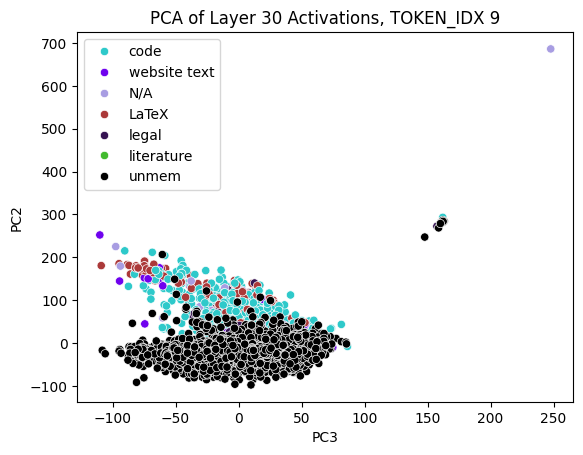

In [149]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create the scatterplot
sns.scatterplot(data=pca_df, x="x", y="y", hue="category", palette=color_map)

# Set the title and axis labels
plt.title(f'PCA of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}')
plt.xlabel(f'PC{pc_x}')
plt.ylabel(f'PC{pc_y}')

# Show the legend
plt.legend()

# Display the plot
plt.show()



In [92]:
pca.explained_variance_ratio_

array([0.30374415, 0.02037261, 0.01695099, 0.01204766, 0.00889271,
       0.00781754, 0.0066541 , 0.00558443, 0.00528079, 0.00511285])

In [269]:
pca.explained_variance_ratio_

array([0.29879929, 0.02488588, 0.02115037, 0.00875192, 0.00825759,
       0.00708999])

#### example gpt4 classifications

In [278]:
load_dotenv()
from openai import OpenAI

client = OpenAI(api_key = os.getenv("OPENAI_API_KEY"))

class OpenAIModel():
    def __init__(self, engine, system_prompt = None):
        self.engine = engine
        self.system_prompt = system_prompt
    
    def get_embedding(self, text):
        text = text.replace("\n", " ")
        return client.embeddings.create(
                input = [text], 
                model=self.engine)['data'][0]['embedding']
    
    def get_chat_completion(self, messages, max_tokens: int = 1700):
        return client.chat.completions.create(
            model=self.engine,
            messages=messages,
            max_tokens = max_tokens,
            )['choices'][0]['message']['content']

    def classify_text(self, query):        
        return client.chat.completions.create(
        model=self.engine,
        response_format={ "type": "json_object" },
        messages=[
            {"role": "system", "content": self.system_prompt},
            {"role": "user", "content": query}
        ]
        )

In [279]:

system_prompt = """You are an intelligent and helpful assistant who will classify text. Your output will be a JSON that contains the category of the text and more details. Categories should be high level, like code, documentation, literature, legal, numbers, website text, etc. If you don't know the category, write N/A. Feel free to come up with your own categories. Details should give more specific information. For example, if the category is code, say what language; if it's legal, is it a warranty, contract, license, etc. Here are some examples for you.\nText:  '<link rel="stylesheet" type="text/css" href="../../../../stylesheet.css" title="Style">\n<link rel="stylesheet" type="text/css" href="../../../../jquery/jquery-ui.css" title="Style">\n<script type="text/javascript" src="../../../../script.js"></'\nYou: {'category': 'code', 'details': 'css'}. Text:  ' against all the gods of Egypt I will execute judgment: I am the LORD. And the blood shall be to you for a token upon the houses where ye are: and when I see the blood, I will pass over you, and the plague shall not be upon you to destroy you, when I smite the land'\nYou: {'category': 'literature', 'details': 'bible'}.\n
"""
gpt4 = OpenAIModel("gpt-4-1106-preview", system_prompt = system_prompt)

In [ ]:
classifications = []
for t in tqdm(mem_12b_data['gen'].to_list()):
    classifications.append(gpt4.classify_text(f"Text: {t}\nYou:"))

In [214]:
t = " an off day in Louisville.\n\nFree digital issue:\n\nCyclocross MagazineAbout Us\n\nCyclocross Magazine is a print and digital magazine and website for the cyclocross community by cyclocross racers. We’re based on community-contributed content, which means we welcome content submissions"
res = gpt4.classify_text(f"Text: {t}\nYou:")
res.choices[0].message.content

'{"category": "website text", "details": "online magazine promotion"}'

In [211]:
mem_12b_data['gen'].to_list()[7:17]

[' must be set accordingly:\r\n    \r\n    Note - application/x-microsoft.net.object.binary.base64 is the format \r\n    that the ResXResourceWriter will generate, however the reader can \r\n    read any of the formats listed below.\r\n    \r\n    mimetype: application',
 "0A -> CONTROL CHARACTER\n    '\\x0b'     #  0x0B -> CONTROL CHARACTER\n    '\\x0c'     #  0x0C -> CONTROL CHARACTER\n    '\\r'       #  0x0D -> CONTROL CHAR",
 '}}).\\end{array}$$\\end{document}$$$$\\documentclass[12pt]{minimal}\n                \\usepackage{amsmath}\n                \\usepackage{wasysym} \n                \\usepackage{amsfonts} \n                \\usepackage{amssymb} \n                \\usepackage{amsbsy}\n                \\usepackage{mathrsfs}\n                \\',
 '</a></li><li><a href="Phaser.Physics.Matter.Components.Sleep.html">Phaser.Physics.Matter.Components.Sleep</a></li><li><a href="Phaser.Physics.Matter.Components.Static.html">Phaser',
 " (errno: 165 - Table is read only)\nERROR HY000: Ca

In [212]:
[c.choices[0].message.content for c in classifications]

['{"category": "documentation", "details": "MIME type information"}',
 '{"category": "code", "details": "ASCII control characters representation"}',
 '{"category": "code", "details": "LaTeX"}',
 '{"category": "code", "details": "HTML with references to a JavaScript framework (Phaser.js)"}',
 '{"category": "code", "details": "database error log"}',
 '{"category": "code", "details": "C or C-like language"}',
 '{"category": "code", "details": "LaTeX"}',
 '{"category": "legal", "details": "software license"}',
 '{"category": "code", "details": "configuration settings for a C/C++ compiler, likely Xcode or similar IDE"}',
 '{"category": "numbers", "details": "byte values or array data"}']

In [209]:
mem_12b_data['gen'].to_list()[:10]

['xsd:string" minOccurs="0" msdata:Ordinal="1" />\n                <xsd:element name="comment" type="xsd:string" minOccurs="0" msdata:Ordinal="2" />\n              </xsd:sequence>\n              <xsd:attribute name',
 ' (contacts == null)? null : contacts.get(i);\n    }\n\n    @Override\n    public long getItemId(int i) {\n        return i;\n    }\n\n    @Override\n    public View getView(int i, View view, ViewGroup viewGroup)',
 'cdcdc; text-align:center| Midfielders\n\n|-\n! colspan=10 style=background:#dcdcdc; text-align:center| Forwards\n\n|-\n! colspan=10 style=background:#dcdcdc; text-align:center| Players transferred out',
 '\n\t\t<read echo="ascii"><delim>\\n</delim><match><data>1) Send Message\\n</data></match></read>\n\t\t<read echo="ascii"><delim>\\n</delim><match><data>2) Read Message\\n</data></match></read>\n\t\t',
 '\x83Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x

In [208]:
[c.choices[0].message.content for c in classifications]

['{"category": "code", "confidence": 1, "details": "XML Schema"}',
 '{"category": "code", "confidence": 0.99, "details": "java"}',
 '{"category": "code", "confidence": 0.9, "details": "markup/wikitext"}',
 '{"category": "code", "confidence": 0.95, "details": "XML or structured markup"}',
 '{\n  "category": "N/A",\n  "confidence": 0.1,\n  "details": "The text contains non-standard characters or could be corrupted, unrecognizable text."\n}',
 '{\n  "category": "code",\n  "confidence": 0.9,\n  "details": "C or C-like language (incomplete code snippet)"\n}',
 '{\n  "category": "code",\n  "confidence": 0.95,\n  "details": "likely MATLAB or similar numerical computing environment"\n}',
 '{"category": "code", "confidence": 0.9, "details": "configuration or documentation comment"}',
 '{"category": "code", "confidence": 0.9, "details": "escape sequences / character literals"}',
 '{"category": "code", "confidence": 1, "details": "LaTeX"}']

### umap/tsne

In [131]:
import umap

LAYER = 35
TOKEN_IDX = 9

X = mem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()
reducer = umap.UMAP(n_neighbors = 40, metric='cosine')

embedding = reducer.fit_transform(X)

In [138]:
df = pd.DataFrame.from_dict({"x" : embedding[:, 0], 
                        "y" : embedding[:, 1], 
                        "category" : new_categories,
                        'index': list(range(len(embedding))),
                        'json': gpt4_cluster_labels})

hovertext = []
for i in range(len(embedding)):
    # hovertext.append(f"{i}{gpt4_cluster_labels[i]} Prompt: {mem_12b_data['gen'].to_list()[i]}")
    hovertext.append(f"{i}{gpt4_cluster_labels[i]}{new_categories[i]}")

# Create the scatter plot with hovertext
# fig = go.Figure(data=go.Scatter(
#     x=embedding[:, 0],
#     y=embedding[:, 1],
#     mode='markers',
#     marker=dict(
#         color=new_color_list,
#     ),
#     text = hovertext,
#     hoverinfo = ['text']
# ))

fig = px.scatter(df, x="x", y="y", color="category", 
                 hover_data=['json'])
fig.update_layout(
    title=f'UMAP of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title='PC1',
    yaxis_title='PC2',
    showlegend=True
)

fig.show()

In [77]:
import umap
LAYER = 30
TOKEN_IDX = 9

# Get the activations for the layer n
mem_activations = mem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()[:3373]
unmem_activations = unmem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()

# Combine memmed and unmemmed activations
activations = np.concatenate((mem_activations, unmem_activations), axis=0)

reducer = umap.UMAP()

embedding = reducer.fit_transform(activations)

In [80]:
unmem_mem_categories = unmem_mem_categories[:3373] + unmem_mem_categories[4306:]
unmem_mem_gpt4_cluster_labels = unmem_mem_gpt4_cluster_labels[:3373] + unmem_mem_gpt4_cluster_labels[4306:]


In [85]:

pca_df = pd.DataFrame.from_dict({"x" : embedding[:, 0], 
                        "y" : embedding[:, 1], 
                        "mem_status": [0]*mem_activations.shape[0] + [1]*unmem_activations.shape[0],
                        "category" : unmem_mem_categories,
                        'index': list(range(len(embedding))),
                        'json': unmem_mem_gpt4_cluster_labels})


fig = px.scatter(pca_df, x="x", y="y", 
                 color="category", 
                # color = "mem_status",
                 hover_data=['json'],
                 color_discrete_map=color_map,
                )
fig.update_layout(
    title=f'UMAP of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title=f'C{0}',
    yaxis_title=f'C{1}',
    showlegend=True
)

fig.show()

In [140]:
from sklearn.manifold import TSNE

X_embedded = TSNE(n_components=2, 
                  learning_rate="auto",
                  init='pca', 
                  perplexity=30,
                  n_iter = 2500,
                  early_exaggeration=20).fit_transform(X)



In [141]:
tsne_df = pd.DataFrame.from_dict({"x" : X_embedded[:, 0], 
                        "y" : X_embedded[:, 1], 
                        "category" : new_categories,
                        'index': list(range(len(embedding))),
                        'json': gpt4_cluster_labels})


fig = px.scatter(tsne_df, x="x", y="y", color="category", 
                 hover_data=['json'])
fig.update_layout(
    title=f'UMAP of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title='PC1',
    yaxis_title='PC2',
    showlegend=True
)

fig.show()

## Training the Probes

### doing the layer/token idx sweep

In [7]:
from probes import LRProbe
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

# Combine memmed and non_memmed hidden states
np_mem = mem_hidden_states.cpu().float()[:unmem_hidden_states.shape[0]]
np_unmem = unmem_hidden_states.cpu().float()

N_LAYERS = np_mem.shape[1]
N_TOKS = np_mem.shape[2]

probes = [[None for _ in range(N_TOKS)] for _ in range(N_LAYERS)]
probe_accs = [[None for _ in range(N_TOKS)] for _ in range(N_LAYERS)]
probe_aucs = [[None for _ in range(N_TOKS)] for _ in range(N_LAYERS)]

def get_probe_auc(probe, X_test, y_test):
    preds = probe.predict_proba(X_test)[:, 1] #gets the probabilities associated with class 1
    auc = roc_auc_score(y_test, preds)
    return auc

In [ ]:
print("started training probes")
for layer in tqdm(range(N_LAYERS)):
    for tok_idx in range(N_TOKS):
        X = torch.cat([np_mem[:, layer, tok_idx, :], np_unmem[:, layer, tok_idx, :]])
        y = torch.cat([torch.ones(np_mem.shape[0]), torch.zeros(np_unmem.shape[0])])
        
        X_train, X_test, y_train, y_test = train_test_split(X.numpy(), y.numpy(), test_size=0.40, random_state=42)
        
        #Pytorch code
        X_train = torch.from_numpy(X_train)
        X_test = torch.from_numpy(X_test)
        y_train = torch.from_numpy(y_train)
        y_test = torch.from_numpy(y_test)
        
        X_train = (X_train - X_train.mean(dim = 0)) / X_train.std(dim = 0)
        X_test = (X_test - X_train.mean(dim = 0)) / X_train.std(dim = 0)

        probe = LRProbe.from_data(X_train, y_train, device = "cuda")
        
        probes[layer][tok_idx] = probe
        probe_accs[layer][tok_idx] = LRProbe.get_probe_accuracy(probe, X_test, y_test, device = "cuda")
        probe_aucs[layer][tok_idx] = LRProbe.get_probe_auc(probe, X_test, y_test, device = "cuda")
        
        # Sk-learn code
        # X_train = (X_train - X_train.mean(axis = 0)) / X_train.std(axis = 0)
        # X_test = (X_test - X_train.mean(axis = 0)) / X_train.std(axis = 0)
        
        # probe = LogisticRegression(solver = "sag", max_iter = 1000).fit(X_train, y_train)
        # probes[layer][tok_idx] = probe
        # probe_accs[layer][tok_idx] = probe.score(X_test, y_test)
        # probe_aucs[layer][tok_idx] = get_probe_auc(probe, X_test, y_test)
        
        print(f"PROBE LAYER {layer} TOKEN {tok_idx}")
        print(f"Accuracy {probe_accs[layer][tok_idx]}")
        print(f"AUC {probe_aucs[layer][tok_idx]}")
        print()


In [47]:
probe_accs_np = np.array(probe_accs).T

tok_idxs =  (7 * np.arange(10)).tolist() #every 5th token
tok_idxs[-1]= tok_idxs[-1] - 1 #goes from 63 to 62

fig = px.imshow(probe_accs_np, y=[str(i) for i in tok_idxs], x=[str(i) for i in range(probe_accs_np.shape[1])]) 
                # color_continuous_scale="RdBu",
                # color_continuous_midpoint=0.5)
fig.update_layout(
    title="Probe Accuracy, Pythia-12b",
    xaxis_title="Layers",
    yaxis_title="Tokens",

)

fig.show()

In [93]:
px.line(probe_accs_np.mean(axis = 0))

In [94]:
px.line(probe_accs_np.mean(axis = 1))

In [25]:
probe_aucs_np = np.array(probe_aucs).T

tok_idxs =  (7 * np.arange(10)).tolist() #every 5th token
tok_idxs[-1]= tok_idxs[-1] - 1 #goes from 63 to 62

fig = px.imshow(probe_aucs_np, y=[str(i) for i in tok_idxs], x=[str(i) for i in range(probe_aucs_np.shape[1])])
fig.update_layout(
    title="Probe AUC, Pythia-12b",
    xaxis_title="Layers",
    yaxis_title="Tokens"
)

fig.show()

In [61]:
# debugging auc/acc discrepancy
layer = 5
tok_idx = 2

X = torch.cat([np_mem[:, layer, tok_idx, :], np_unmem[:, layer, tok_idx, :]])
y = torch.cat([torch.ones(np_mem.shape[0]), torch.zeros(np_unmem.shape[0])])

X_train, X_test, y_train, y_test = train_test_split(X.numpy(), y.numpy(), test_size=0.40, random_state=42)

#Pytorch code
X_train = torch.from_numpy(X_train)
X_test = torch.from_numpy(X_test)
y_train = torch.from_numpy(y_train)
y_test = torch.from_numpy(y_test)

X_train = (X_train - X_train.mean(dim = 0)) / X_train.std(dim = 0)
# X_test = (X_test - X_train.mean(dim = 0)) / X_train.std(dim = 0)
X_test = X_test.to("cuda")
probas = probes[layer][tok_idx].pred_proba(X_test)

In [62]:
px.histogram(probas.detach().cpu().numpy())

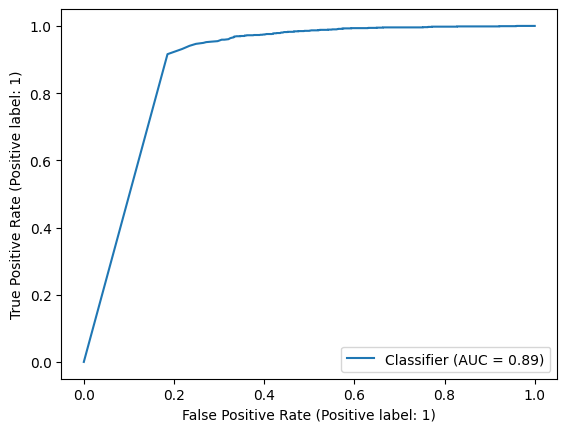

In [63]:
from sklearn.metrics import RocCurveDisplay

display = RocCurveDisplay.from_predictions(y_test.detach().cpu().numpy(), probas.detach().cpu().numpy())

In [82]:
roc_auc_score(y_test.detach().cpu().numpy()[:10], probas.detach().cpu().numpy()[:10])

0.875

In [76]:
y_test.detach().cpu().numpy()[:10]

array([1., 0., 0., 0., 0., 1., 0., 0., 0., 0.], dtype=float32)

In [77]:
probas.detach().cpu().numpy()[:10]

array([1.        , 0.99999905, 0.9999943 , 1.        , 0.95781446,
       1.        , 0.9999007 , 0.9999995 , 0.9985538 , 1.        ],
      dtype=float32)

In [91]:
roc_auc_score([1., 0., 0., 0., 0., 1., 0., 0., 0., 0.], [1.        , 0.99999905, 0.9999943 , 1.        , 0.95781446,
       1.        , 0.9999007 , 1 , 1 , 1.        ])

0.75

In [92]:
roc_auc_score([1., 0., 0., 0., 0., 1., 0., 0., 0., 0.], [1.        , 0.99999905, 0.9999943 , 1.        , 0.95781446,
       1.        , 0.9999007 , 0.998 , 0.9999 , 0.999])

0.9375

In [58]:
N = 1331
roc_auc_score([0]*N + [1]*N, (1/3 * np.random.rand(158)).tolist() + [1]*2504)


0.5593538692712247

In [41]:
px.histogram(y_test.detach().cpu().numpy())

###  actual probe

In [212]:
from probes import LRProbe
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from sklearn.linear_model import LogisticRegression
from datasets import load_from_disk, DatasetDict

LAYER = 34
TOK_IDXS = [5, 6, 7, 8, 9]

path = 'data/12b'
dataset = load_from_disk(os.path.join(path, 'split_hf_token_dataset_vary_len_v2'))

In [208]:
train_rows = all_mem_12b_data.loc[dataset['train']['df_ref_idx'][:int(len(dataset['train']['df_ref_idx']) / 5)]]
val_rows = all_mem_12b_data.loc[dataset['val']['df_ref_idx'][:int(len(dataset['val']['df_ref_idx']) / 5)]]
test_rows = all_mem_12b_data.loc[dataset['test']['df_ref_idx'][:int(len(dataset['test']['df_ref_idx']) / 5)]]

print(train_rows.shape, val_rows.shape, test_rows.shape)

(4047, 7) (675, 7) (2024, 7)


In [36]:
# X = torch.cat([np_mem[:, LAYER, tok_idx, :] for tok_idx in TOK_IDXS] +  [np_unmem[:, LAYER, tok_idx, :] for tok_idx in TOK_IDXS])
# y = torch.cat([torch.ones(np_mem.shape[0]) for _ in TOK_IDXS] + [torch.zeros(np_unmem.shape[0]) for _ in TOK_IDXS])

def rows_to_X_y(rows, layer = None, tok_idxs = None):
    X = []
    y = []
    for i, row in rows.iterrows():
        if row['source'] == 'pythia-evals':
            X.append(mem_hiddens[row['idx_in_hidden_states']])
        elif row['source'] == 'pile':
            X.append(pile_hiddens[row['idx_in_hidden_states']])
        
        if row['char_by_char_similarity'] == 1:
            y.append(1)
        else:
            y.append(0)
        
    if tok_idxs is not None and layer is not None:
        y = torch.from_numpy(np.array([[label] * len(tok_idxs) for label in y]).flatten())
        
        new_X = []
        for x in X:
            new_X.append(torch.stack([x[layer, tok_idx] for tok_idx in tok_idxs]))
        # X = [x[layer, tok_idx] for tok_idx in tok_idxs for x in X] #this also concats by tok_idxs first fuck
        #torch.stack([X[:, layer, tok_idx, :] for tok_idx in tok_idxs], dim = 0).float() this concats so that the labels are not in the right order
        return torch.cat(new_X, dim = 0).float(), y.float()
    else:
        return torch.stack(X, dim = 0).float(), torch.tensor(y).float()

In [210]:
X_train, y_train = rows_to_X_y(train_rows, layer = LAYER, tok_idxs = TOK_IDXS)
X_val, y_val = rows_to_X_y(val_rows, layer = LAYER, tok_idxs = TOK_IDXS)
X_test, y_test = rows_to_X_y(test_rows, layer = LAYER, tok_idxs = TOK_IDXS)

In [213]:
lr = 0.05
weight_decay = 0.5
epochs = 500
use_bias = True
normalize = False

if normalize:
    X_train = (X_train - X_train.mean(dim = 0)) / X_train.std(dim = 0)
    X_val = (X_val - X_train.mean(dim = 0)) / X_train.std(dim = 0)

probe = LRProbe.from_data(X_train, y_train, 
                          lr = lr, 
                          weight_decay = weight_decay, 
                          epochs = epochs, 
                          use_bias = use_bias,
                          device = "cuda", )

acc = probe.get_probe_accuracy(X_val, y_val, device = "cuda")
auc = probe.get_probe_auc(X_val, y_val, device = "cuda")

print(f"PROBE LAYER {LAYER} TOKEN {TOK_IDXS}")
print(f"Accuracy {acc}")
print(f"AUC {auc}")
print()

PROBE LAYER 34 TOKEN [5, 6, 7, 8, 9]
Accuracy 0.9440000057220459
AUC 0.9752206205116499



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Test Accuracy: 0.9371541142463684
Test AUC: 0.9660749627239618


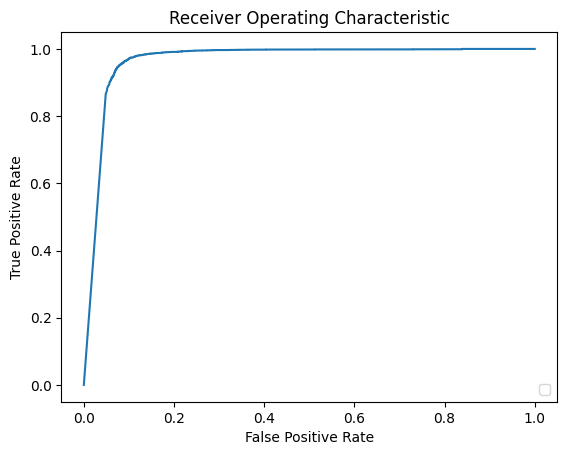

In [181]:
test_acc = probe.get_probe_accuracy(X_test, y_test, device="cuda")
test_auc = probe.get_probe_auc(X_test, y_test, device="cuda")

print(f"Test Accuracy: {test_acc}")
print(f"Test AUC: {test_auc}")

from sklearn.metrics import roc_curve, RocCurveDisplay

X_test = X_test.to("cuda")
probas = probe.pred_proba(X_test)
fpr, tpr, _ = roc_curve(y_test.detach().cpu().numpy(), probas.detach().cpu().numpy())

roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr)
roc_display.plot()
plt.title('Receiver Operating Characteristic')
plt.show()

In [ ]:
from sklearn.metrics import classification_report

y_pred = probe.predict(X_test)
report = classification_report(y_test.detach().cpu().numpy(), y_pred.detach().cpu().numpy())

print(report)


In [182]:
torch.save(probe.state_dict(), 'data/12b/probe_weights.pth')

In [139]:
lr = 0.05
weight_decay = 0.5
epochs = 500
use_bias = True

# num_dps = list(range(1, int(X_train.shape[0] / 5) + 1))

num_dps = [1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4047]
accs = []
aucs = []
for num_dp in tqdm(num_dps):
    probe = LRProbe.from_data(X_train[:num_dp * 5], y_train[:num_dp * 5], 
                            lr = lr, 
                            weight_decay = weight_decay, 
                            epochs = epochs, 
                            use_bias = use_bias,
                            device = "cuda", )

    accs.append(probe.get_probe_accuracy(X_val, y_val, device = "cuda"))
    aucs.append(probe.get_probe_auc(X_val, y_val, device = "cuda"))

  0%|          | 0/13 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:07<00:00,  1.85it/s]


In [159]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create subplots with two rows (for Accuracy and AUC) and one column
# fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1, subplot_titles=("Accuracy", "AUC"))

# # Create a line plot for Accuracy
# trace1 = go.Scatter(y=accs, mode='lines+markers', name='Accuracy')

# # Create a line plot for AUC
# trace2 = go.Scatter(y=aucs, mode='lines+markers', name='AUC')

# # Add the traces to the respective subplots
# fig.add_trace(trace1, row=1, col=1)
# fig.add_trace(trace2, row=2, col=1)

fig = px.line(accs)
fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = list(range(len(accs))),
        ticktext = num_dps,
    )
)

# Update the layout with y-axis labels and titles
fig.update_yaxes(title_text="Accuracy", row=1, col=1)
fig.update_yaxes(title_text="AUC", row=2, col=1)
fig.update_layout(title="Accuracy vs Number of Data Points")

# Show the combined figure
fig.show()


In [161]:

fig = px.line(aucs)
fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = list(range(len(accs))),
        ticktext = num_dps,
    )
)
# Update the layout with y-axis labels and titles
fig.update_layout(title="AUC vs Number of Data Points", xaxis_title="Number of Data Points", yaxis_title="AUC")

# Show the combined figure
fig.show()


In [165]:
import plotly.graph_objects as go

# Create a figure
fig = go.Figure()

# Create a line plot for Accuracy
fig.add_trace(go.Scatter(x=list(range(len(accs))), y=accs, mode='lines+markers', name='Accuracy'))

# Create a line plot for AUC
fig.add_trace(go.Scatter(x=list(range(len(accs))), y=aucs, mode='lines+markers', name='AUC'))

# Update the layout with x-axis labels and titles
fig.update_xaxes(title_text="Number of Data Points")
fig.update_yaxes(title_text="Acc/AUC")
fig.update_layout(title="Accuracy and AUC vs Number of Data Points")
fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = list(range(len(accs))),
        ticktext = num_dps,
    )
)
# Show the combined figure
fig.show()


#### mlp/attn probes

In [64]:
from probes import LRProbe
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from sklearn.linear_model import LogisticRegression
from datasets import load_from_disk, DatasetDict

LAYER = 34
TOK_IDXS = [5, 6, 7, 8, 9]

acts_dict = torch.load('data/12b/attn_mlp_from_pregennedacts_dict.pt')

In [61]:
X = np.concatenate(attn_acts) #p sure this does it correctly, where it concats by tok_idxs first
y = [1] * int(X.shape[0] / 2) + [0] * int(X.shape[0] / 2)

In [62]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.40, random_state=42)
X_train = torch.from_numpy(X_train).float()
X_val = torch.from_numpy(X_val).float()
y_train = torch.from_numpy(np.array(y_train)).float()
y_val = torch.from_numpy(np.array(y_val)).float()

In [63]:
lr = 0.05
weight_decay = 0.5
epochs = 500
use_bias = True
normalize = False

probe = LRProbe.from_data(X_train, y_train, 
                        lr = lr, 
                        weight_decay = weight_decay, 
                        epochs = epochs, 
                        use_bias = use_bias,
                        device = "cuda", )

acc = probe.get_probe_accuracy(X_val, y_val, device = "cuda")
auc = probe.get_probe_auc(X_val, y_val, device = "cuda")

print(f"PROBE LAYER {LAYER} TOKEN {TOK_IDXS}")
print(f"Accuracy {acc}")
print(f"AUC {auc}")
print()

PROBE LAYER 34 TOKEN [5, 6, 7, 8, 9]
Accuracy 0.9150000214576721
AUC 0.9666312461253567



In [66]:
lr = 0.05
weight_decay = 0.5
epochs = 500
use_bias = True
normalize = False

act_type_to_res = {
    'attn': {'auc': [], 'acc': []},
    'mlp': {'auc': [], 'acc': []}
}

for act_type in ['mlp', 'attn']:
    for layer in tqdm(range(36)):
        acts = acts_dict[act_type][layer][:, TOK_IDXS, :].numpy()
        
        X = np.concatenate(acts) #p sure this does it correctly, where it concats by tok_idxs first
        y = [1] * int(X.shape[0] / 2) + [0] * int(X.shape[0] / 2)
        
        X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.40, random_state=42)
        X_train = torch.from_numpy(X_train).float()
        X_val = torch.from_numpy(X_val).float()
        y_train = torch.from_numpy(np.array(y_train)).float()
        y_val = torch.from_numpy(np.array(y_val)).float()
        
        probe = LRProbe.from_data(X_train, y_train, 
                                lr = lr, 
                                weight_decay = weight_decay, 
                                epochs = epochs, 
                                use_bias = use_bias,
                                device = "cuda", )

        acc = probe.get_probe_accuracy(X_val, y_val, device = "cuda")
        auc = probe.get_probe_auc(X_val, y_val, device = "cuda")
        act_type_to_res[act_type]['acc'].append(acc)
        act_type_to_res[act_type]['auc'].append(auc)

  0%|          | 0/36 [00:00<?, ?it/s]

100%|██████████| 36/36 [00:15<00:00,  2.36it/s]


In [67]:
import plotly.graph_objects as go

# Create a figure
fig = go.Figure()

# Create a line plot for mlp auc
fig.add_trace(go.Scatter(x=list(range(len(act_type_to_res['mlp']['auc']))), y=act_type_to_res['mlp']['auc'], mode='lines+markers', name='MLP AUC'))

# Create a line plot for mlp acc
fig.add_trace(go.Scatter(x=list(range(len(act_type_to_res['mlp']['acc']))), y=act_type_to_res['mlp']['acc'], mode='lines+markers', name='MLP Accuracy'))

# Create a line plot for attn auc
fig.add_trace(go.Scatter(x=list(range(len(act_type_to_res['attn']['auc']))), y=act_type_to_res['attn']['auc'], mode='lines+markers', name='Attention AUC'))

# Create a line plot for attn acc
fig.add_trace(go.Scatter(x=list(range(len(act_type_to_res['attn']['acc']))), y=act_type_to_res['attn']['acc'], mode='lines+markers', name='Attention Accuracy'))

# Update the layout with x-axis labels and titles
fig.update_xaxes(title_text="Layer")
fig.update_yaxes(title_text="Value")
fig.update_layout(title="MLP and Attention AUC and Accuracy vs Layer")
fig.show()


In [82]:
print( max(act_type_to_res['attn']['auc']),  act_type_to_res['attn']['auc'].index(max(act_type_to_res['attn']['auc'])))

0.9917995270806897 16


In [83]:
print( max(act_type_to_res['attn']['acc']),  act_type_to_res['attn']['acc'].index(max(act_type_to_res['attn']['acc'])))

0.9585000276565552 15


#### cheeky hparam search

In [105]:
# Define the ranges for hyperparameters
lr_range = [0.0001, 0.1]
weight_decay_range = [0.01, 1]
epochs_range = [500, 2500]
use_bias_range = [True, False]
normalize_range = [True, False]

N_ITER = 100
probes = []
configs = []
accs = []
aucs = []
for i in range(N_ITER):
    # Randomly sample hyperparameters
    lr = random.uniform(lr_range[0], lr_range[1])
    weight_decay = random.uniform(weight_decay_range[0], weight_decay_range[1])
    epochs = random.randint(epochs_range[0], epochs_range[1])
    use_bias = random.choice(use_bias_range)
    normalize = random.choice(normalize_range)
    config = {"lr": lr, "weight_decay": weight_decay, "epochs": epochs, "use_bias": use_bias, "normalize": normalize}
    
    if normalize:
        X_train = (X_train - X_train.mean(dim=0)) / X_train.std(dim=0)
        X_val = (X_val - X_train.mean(dim=0)) / X_train.std(dim=0)
    
    probe = LRProbe.from_data(X_train, y_train,
                            lr=lr,
                            weight_decay=weight_decay,
                            epochs=epochs,
                            use_bias=use_bias,
                            device="cuda")

    probes.append(probe)
    configs.append(config)
    accs.append(probe.get_probe_accuracy(X_val, y_val, device="cuda"))
    aucs.append(probe.get_probe_auc( X_val, y_val, device="cuda"))

    print(f"Config: {config}")
    print(f"Accuracy {accs[i]}")
    print(f"AUC {aucs[i]}")
    print()


Config: {'lr': 0.0705610765275163, 'weight_decay': 0.6741966912125107, 'epochs': 645, 'use_bias': False, 'normalize': False}
Accuracy 0.9271110892295837
AUC 0.9786968201850649

Config: {'lr': 0.055245603028108846, 'weight_decay': 0.7786226461533229, 'epochs': 756, 'use_bias': False, 'normalize': True}
Accuracy 0.940148115158081
AUC 0.969658665917511

Config: {'lr': 0.05438113194520767, 'weight_decay': 0.46117841595003695, 'epochs': 1923, 'use_bias': False, 'normalize': False}
Accuracy 0.9324444532394409
AUC 0.9667959545590223

Config: {'lr': 0.04569764002946162, 'weight_decay': 0.37365264777664703, 'epochs': 949, 'use_bias': False, 'normalize': True}
Accuracy 0.936296284198761
AUC 0.9695424297227538

Config: {'lr': 0.07176961261842459, 'weight_decay': 0.6837640268921978, 'epochs': 1242, 'use_bias': False, 'normalize': False}
Accuracy 0.9368888735771179
AUC 0.9720615244148684

Config: {'lr': 0.0948564102035075, 'weight_decay': 0.237342380242718, 'epochs': 931, 'use_bias': True, 'normali

In [120]:
best_acc_idx = accs.index(max(accs))
best_auc_idx = aucs.index(max(aucs))
configs[best_acc_idx]

print(max(accs), max(aucs))
print(configs[best_acc_idx])
print(configs[best_auc_idx])

0.9422221779823303 0.9786968201850649
{'lr': 0.05612958423700267, 'weight_decay': 0.6004301299442545, 'epochs': 1121, 'use_bias': True, 'normalize': False}
{'lr': 0.0705610765275163, 'weight_decay': 0.6741966912125107, 'epochs': 645, 'use_bias': False, 'normalize': False}


In [ ]:
import matplotlib.pyplot as plt

# Create lists of learning rate, accuracy, and AUC values
config_hyperparameter = 'normalize'
config_values = [config[config_hyperparameter] for config in configs]
acc_values = [acc for acc in accs]
auc_values = [auc for auc in aucs]

# Create a scatter plot for learning rate vs accuracy
trace1 = go.Scatter(x=config_values, y=acc_values, mode='markers', name='Accuracy')

# Create a scatter plot for learning rate vs AUC
trace2 = go.Scatter(x=config_values, y=auc_values, mode='markers', name='AUC')

# Create a layout for the combined plot
layout = go.Layout(
    title=f'{config_hyperparameter} vs Accuracy and AUC',
    xaxis=dict(title=config_hyperparameter),
    yaxis=dict(title='Value'),
)

# Create the combined figure
fig = go.Figure(data=[trace1, trace2], layout=layout)

# Show the plot
fig.show()

## generalization datasets

In [3]:

from datasets import load_from_disk, DatasetDict

LAYER = 34
TOK_IDXS = [5, 6, 7, 8, 9]

path = 'data/12b'
fuzzy_pos_dataset = load_from_disk(os.path.join(path, 'generalization_datasets_v2/fuzzy_pos'))
prefix_dataset = load_from_disk(os.path.join(path, 'generalization_datasets_v2/prefix'))

In [4]:
from act_add.model_wrapper import ModelWrapper
model_name_or_path = "EleutherAI/pythia-12b"

model = AutoModelForCausalLM.from_pretrained(model_name_or_path, torch_dtype=torch.float16, device_map="auto").eval()
tokenizer = AutoTokenizer.from_pretrained(model_name_or_path, padding_side="left")
tokenizer.pad_token = tokenizer.eos_token

mw = ModelWrapper(model = model, tokenizer = tokenizer)

Loading checkpoint shards: 100%|██████████| 3/3 [00:21<00:00,  7.06s/it]
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [5]:
from probes import LRProbe
probe = LRProbe(d_in = 5120, use_bias = True).to("cuda")

probe.load_state_dict(torch.load("data/12b/probe_weights.pth"))

<All keys matched successfully>

### fuzzy pos

In [169]:
fuzzy_pos_dataset
fuzzy_pos_rows = all_mem_12b_data.loc[fuzzy_pos_dataset['df_ref_idx']]

fuzzy_pos_rows

,gen,ground,mem_status,source,idx_in_ground,idx_in_hidden_states,char_by_char_similarity
36,"money glitch,solo\nmoney glitch,patch 1.26,pat...","money glitch,solo\nmoney glitch,patch 1.26,pat...",0.500000,pythia-evals,36,36,0.929577
47,)\n at java.util.regex.Pattern.expr(Patt...,)\n at java.util.regex.Pattern.expr(Patt...,0.984375,pythia-evals,47,47,0.987097
59,libraries += SnippetRenderPROFILE\nSnippetSpli...,libraries += SnippetRenderPROFILE\nSnippetSpli...,0.703125,pythia-evals,59,59,0.899497
73,\nCholesterol (mg): 89.7 \nSodium (mg): 919...,\nCholesterol (mg): 89.7 \nSodium (mg): 919...,0.984375,pythia-evals,73,73,0.989247
98,"], S12, 0x4787c62a); /* 6 */\n\tFF(c, d, a, b,...","], S12, 0x4787c62a); /* 6 */\n\tFF(c, d, a, b,...",0.546875,pythia-evals,98,98,0.804878
...,...,...,...,...,...,...,...
9882,"If this is your first visit, be sure to\ncheck...","If this is your first visit, be sure to\ncheck...",0.968750,pile,4926,4894,0.968750
9899,"<?xml version=""1.0"" encoding=""UTF-8""?>\n<!DOCT...","<?xml version=""1.0"" encoding=""UTF-8""?>\n<!DOCT...",0.890625,pile,4943,4911,0.902439
9906,"/*\n* Copyright 2017, GeoSolutions Sas.\n* All...","/*\n* Copyright 2017, GeoSolutions Sas.\n* All...",0.843750,pile,4950,4918,0.839378
9916,"""""""\nauthor: shreyansh kushwaha\nmade on : 08....","""""""\nauthor: shreyansh kushwaha\nmade on : 08....",0.546875,pile,4960,4928,0.938776


In [177]:
def rows_to_X_y(rows, layer = None, tok_idxs = None):
    X = []
    y = []
    for i, row in rows.iterrows():
        if row['source'] == 'pythia-evals':
            X.append(mem_hiddens[row['idx_in_hidden_states']])
        elif row['source'] == 'pile':
            X.append(pile_hiddens[row['idx_in_hidden_states']])
        
        if row['char_by_char_similarity'] == 1:
            y.append(1)
        else:
            y.append(0)
        
    if tok_idxs is not None and layer is not None:
        y = torch.from_numpy(np.array([[label] * len(tok_idxs) for label in y]).flatten())
        
        new_X = []
        for x in X:
            new_X.append(torch.stack([x[layer, tok_idx] for tok_idx in tok_idxs]))
        # X = [x[layer, tok_idx] for tok_idx in tok_idxs for x in X] #this also concats by tok_idxs first fuck
        #torch.stack([X[:, layer, tok_idx, :] for tok_idx in tok_idxs], dim = 0).float() this concats so that the labels are not in the right order
        return torch.cat(new_X, dim = 0).float(), y.float()
    else:
        return torch.stack(X, dim = 0).float(), torch.tensor(y).float()

fuzzy_pos_X, _ = rows_to_X_y(fuzzy_pos_rows, layer = 34, tok_idxs = [9])

In [197]:
fuzzy_pos_labels = fuzzy_pos_dataset['labels']
fuzzy_pos_y = torch.tensor(fuzzy_pos_labels).float()

fuzzy_pos_acc = probe.get_probe_accuracy(fuzzy_pos_X, fuzzy_pos_y, device="cuda")

print(f"Fuzzy POS Accuracy: {fuzzy_pos_acc}")


Fuzzy POS Accuracy: 0.7768924236297607


### prefix

In [37]:
N = 40
prefix_samples = prefix_dataset[:N]['input_ids']
prefix_strings = tokenizer.batch_decode(prefix_samples)

In [38]:
sum([len(i) for i in prefix_dataset[:N]['input_ids']])

5541

In [39]:
prefix_hiddens = mw.batch_to_hiddens(prefix_strings, layers = [34], tok_idx = -1)

In [36]:
del prefix_hiddens
del prefix_X
gc.collect()
torch.cuda.empty_cache()

In [40]:
prefix_labels = prefix_dataset[:N]['labels']
prefix_y = torch.tensor(prefix_labels).float()
prefix_X = prefix_hiddens[34]

prefix_acc = probe.get_probe_accuracy(prefix_X, prefix_y, device="cuda")
prefix_auc = probe.get_probe_auc(prefix_X, prefix_y, device="cuda")
print(f"Prefix Accuracy: {prefix_acc}")
print(f"Prefix AUC: {prefix_auc}")

Prefix Accuracy: 0.875
Prefix AUC: 0.9494949494949495


In [43]:
from sklearn.metrics import classification_report

y_pred = probe.pred(prefix_X.to("cuda"))
report = classification_report(prefix_y.detach().cpu().numpy(), y_pred.detach().cpu().numpy())

print(report)


              precision    recall  f1-score   support

         0.0       0.84      0.95      0.89        22
         1.0       0.93      0.78      0.85        18

    accuracy                           0.88        40
   macro avg       0.89      0.87      0.87        40
weighted avg       0.88      0.88      0.87        40



## Random

In [191]:
duplicated_data = mem_12b_data[mem_12b_data.duplicated(subset='ground', keep=False)]
duplicated_data.to_csv("dupes_according_to_ground.csv", index = False)

In [198]:
mem_12b_data.loc[8847:8849]

,gen,ground,mem_status,source,idx_in_ground,idx_in_hidden_states,char_by_char_similarity
8847,"<?xml version=""1.0"" encoding=""UTF-8""?>\n<proje...","<?xml version=""1.0"" encoding=""UTF-8""?>\n<proje...",0.578125,pile,3888,3859,0.903846
8848,New Zune 2 Flash-Based Players Confirmed\n\nBy...,New Zune 2 Flash-Based Players Confirmed\n\nBy...,0.500000,pile,3889,3860,0.495690
8849,VIDEO: Eamonn Dowd Departure Lounge\n\nTwo art...,VIDEO: Eamonn Dowd Departure Lounge\n\nTwo art...,0.500000,pile,3890,3861,0.488789


In [3]:
from act_add.model_wrapper import ModelWrapper
model_name_or_path = "EleutherAI/pythia-12b"

model = AutoModelForCausalLM.from_pretrained(model_name_or_path, torch_dtype=torch.float16, device_map="auto").eval()
tokenizer = AutoTokenizer.from_pretrained(model_name_or_path, padding_side="left")
tokenizer.pad_token = tokenizer.eos_token

Loading checkpoint shards: 100%|██████████| 3/3 [00:21<00:00,  7.10s/it]
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [6]:
mw = ModelWrapper(model = model, tokenizer = tokenizer)
prompts = ['what the hell is the fuck', 'helo', 'dog woof woof', 'pooopopoopasdp a dasfioa']

hidden_states_dict = mw.batch_hiddens(prompts, layers = [0, 1, 2, 3], tok_idxs = [0, 1, 2], return_types = ['resid', 'mlp', 'attn'])

In [45]:
hidden_states_dict['resid'][3].shape

torch.Size([4, 3, 5120])

In [18]:
b

{1: [1], 4: [], 5: []}

In [7]:
from get_activations import get_memmed_activations_from_pregenned

prompts = all_mem_12b_data[all_mem_12b_data['source'] == 'pythia-evals'][:20].gen.values.tolist() + all_mem_12b_data[all_mem_12b_data['source'] == 'pile'][:20].gen.values.tolist()

tok_idxs = (7 * np.arange(10)).tolist() #every 5th token
tok_idxs[-1]= - 1 #goes from 63 to 62

acts_dict = get_memmed_activations_from_pregenned(mw,
                                                    prompts,
                                                    "data",
                                                    act_types = ['resid', 'mlp', 'attn'],
                                                    # act_types = ['resid', 'attn'],
                                                    save_every = 10,
                                                    layers = None,
                                                    tok_idxs = tok_idxs,
                                                    logging = True,
                                                    file_spec = "attn_mlp_from_pregenned")

Batch 1 of 4
Time elapsed for this batch: 1.50 seconds
Num Hidden States Genned: 10
Shape of resid one batch Hidden States: torch.Size([10, 10, 5120])
Shape of mlp one batch Hidden States: torch.Size([10, 10, 5120])
Shape of attn one batch Hidden States: torch.Size([10, 10, 5120])

Batch 2 of 4
Time elapsed for this batch: 0.97 seconds
Num Hidden States Genned: 10
Shape of resid one batch Hidden States: torch.Size([10, 10, 5120])
Shape of mlp one batch Hidden States: torch.Size([10, 10, 5120])
Shape of attn one batch Hidden States: torch.Size([10, 10, 5120])

Batch 3 of 4
Time elapsed for this batch: 1.26 seconds
Num Hidden States Genned: 10
Shape of resid one batch Hidden States: torch.Size([10, 10, 5120])
Shape of mlp one batch Hidden States: torch.Size([10, 10, 5120])
Shape of attn one batch Hidden States: torch.Size([10, 10, 5120])

Batch 4 of 4
Time elapsed for this batch: 1.29 seconds
Num Hidden States Genned: 10
Shape of resid one batch Hidden States: torch.Size([10, 10, 5120])


In [47]:
tok_idxs

[0, 7, 14, 21, 28, 35, 42, 49, 56, -1]

In [57]:
acts_dict['resid'][1].shape

torch.Size([40, 10, 5120])

In [2]:
import torch
acts_dict = torch.load('data/12b/attn_mlp_from_pregennedacts_dict.pt')